# NLP, speech recognition и немного о временных рядах

## NLP

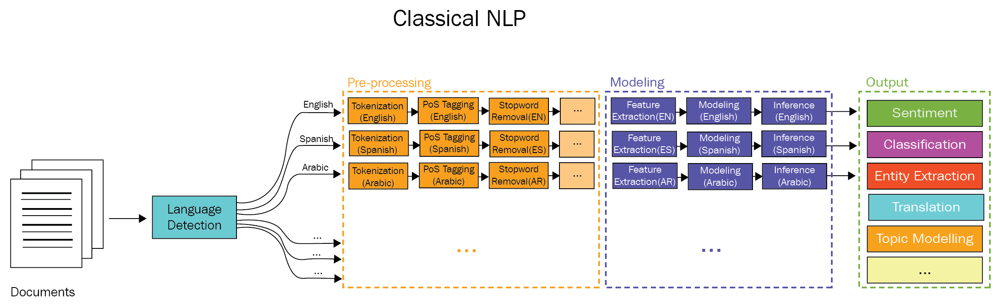

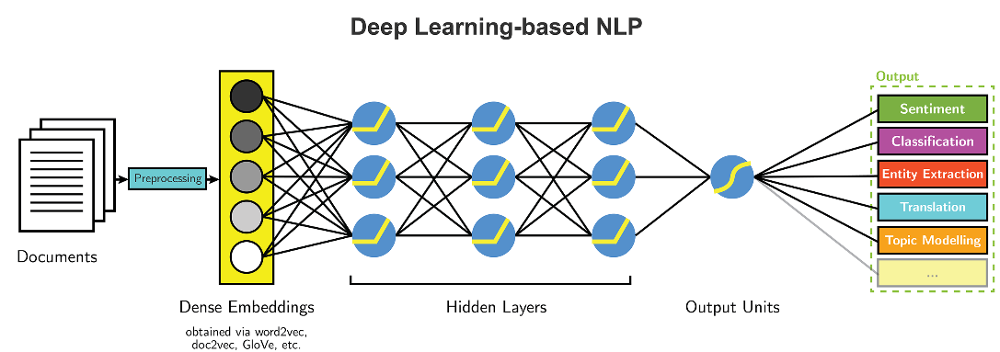

### Как достать данные?

- Публичные датасеты
- Скрапинг
- Image2Text
- Аугментация
- и тд


### Отчистка текста

#### Юникод нормализация
  

In [1]:
text = "GeeksForGeeks ????"
print(text.encode('utf-8')) 
  
text1 = 'गीक्स फॉर गीक्स ????'
print(text1.encode('utf-8'))

b'GeeksForGeeks ????'
b'\xe0\xa4\x97\xe0\xa5\x80\xe0\xa4\x95\xe0\xa5\x8d\xe0\xa4\xb8 \xe0\xa4\xab\xe0\xa5\x89\xe0\xa4\xb0 \xe0\xa4\x97\xe0\xa5\x80\xe0\xa4\x95\xe0\xa5\x8d\xe0\xa4\xb8 ????'


#### Regex

In [2]:
import re
re.split(r'\W+', 'Йоу, че как')

['Йоу', 'че', 'как']

#### Орфографические правки

In [3]:
example = {
    'Алексанлдр': 'Александр',
    'Александр': 'Александр',
}

example['Алексанлдр']

'Александр'

### Обработка текста

#### Токенизация

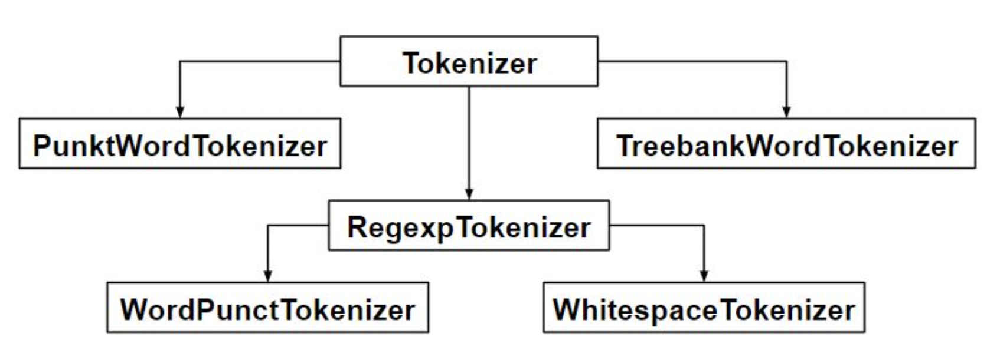

In [4]:
import nltk
nltk.download('punkt')

from nltk.tokenize import sent_tokenize 
from nltk.tokenize import word_tokenize 
from nltk.tokenize import WordPunctTokenizer 

  
text = "Hello. How are you, bro?"
print(sent_tokenize(text))

  
text = "Hello everyone. Whats up?"
print(word_tokenize(text))

  
tokenizer = WordPunctTokenizer() 
print(tokenizer.tokenize("Let's see how it's working."))

['Hello.', 'How are you, bro?']
['Hello', 'everyone', '.', 'Whats', 'up', '?']
['Let', "'", 's', 'see', 'how', 'it', "'", 's', 'working', '.']


[nltk_data] Downloading package punkt to /Users/tam2511/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


#### Всякое

In [5]:
text = "Hello. How are you, bro?"
text = text.lower()

print(text)

hello. how are you, bro?


In [6]:
import nltk
from nltk.corpus import stopwords
 
nltk.download('stopwords')
print(stopwords.words('russian'))

['и', 'в', 'во', 'не', 'что', 'он', 'на', 'я', 'с', 'со', 'как', 'а', 'то', 'все', 'она', 'так', 'его', 'но', 'да', 'ты', 'к', 'у', 'же', 'вы', 'за', 'бы', 'по', 'только', 'ее', 'мне', 'было', 'вот', 'от', 'меня', 'еще', 'нет', 'о', 'из', 'ему', 'теперь', 'когда', 'даже', 'ну', 'вдруг', 'ли', 'если', 'уже', 'или', 'ни', 'быть', 'был', 'него', 'до', 'вас', 'нибудь', 'опять', 'уж', 'вам', 'ведь', 'там', 'потом', 'себя', 'ничего', 'ей', 'может', 'они', 'тут', 'где', 'есть', 'надо', 'ней', 'для', 'мы', 'тебя', 'их', 'чем', 'была', 'сам', 'чтоб', 'без', 'будто', 'чего', 'раз', 'тоже', 'себе', 'под', 'будет', 'ж', 'тогда', 'кто', 'этот', 'того', 'потому', 'этого', 'какой', 'совсем', 'ним', 'здесь', 'этом', 'один', 'почти', 'мой', 'тем', 'чтобы', 'нее', 'сейчас', 'были', 'куда', 'зачем', 'всех', 'никогда', 'можно', 'при', 'наконец', 'два', 'об', 'другой', 'хоть', 'после', 'над', 'больше', 'тот', 'через', 'эти', 'нас', 'про', 'всего', 'них', 'какая', 'много', 'разве', 'три', 'эту', 'моя', 'впр

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/tam2511/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [7]:
import string
 
test_str = "Hello. How are you, bro?"
 
test_str = test_str.translate(str.maketrans('', '', string.punctuation))
print(test_str)

Hello How are you bro


In [8]:
from nltk.stem import PorterStemmer
 
# create an object of class PorterStemmer
porter = PorterStemmer()
print(porter.stem("play"))
print(porter.stem("playing"))
print(porter.stem("plays"))
print(porter.stem("played"))
print(porter.stem("Communication"))

play
play
play
play
commun


In [9]:
from nltk.stem import WordNetLemmatizer
# create an object of class WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
print(lemmatizer.lemmatize("plays", 'v'))
print(lemmatizer.lemmatize("played", 'v'))
print(lemmatizer.lemmatize("play", 'v'))
print(lemmatizer.lemmatize("playing", 'v'))
print(lemmatizer.lemmatize("Communication", 'v'))

play
play
play
play
Communication


### Как перевести текст в вектор?

- One hot encoding
- Bag of words
- Bag of n-grams
- TF-IDF
- Word embedding

#### Bag of words

In [80]:
import nltk 
from nltk.tokenize import sent_tokenize 
from sklearn.feature_extraction.text import CountVectorizer 
Text = """asdjfnjf aksd asjdnf aksd sd fjasd fkajsd. fajskdfasdjk fsa fd"""
# TOKENIZATION 
sentences = sent_tokenize(Text) 
sentences = [sent.lower().replace(".","") for sent in sentences] 
print('Our Corpus:',sentences) 
#CountVectorizer : Convert a collection of text documents to a matrix of token counts. 
count_vect = CountVectorizer() 
# fit & transform will represent each sentences as BOW representation 
BOW = count_vect.fit_transform(sentences) 
# Get the vocabulary 
print("Our vocabulary: ", count_vect.vocabulary_) 
#see the BOW representation 
print(f"BoW representation for {sentences[0]} {BOW[0].toarray()}")
# BOW representation for a new text 
BOW_ = count_vect.transform(["sd fjasd fkajsd"]) 
print("Bow representation for 'sd fjasd fkajsd':", BOW_.toarray())

Our Corpus: ['asdjfnjf aksd asjdnf aksd sd fjasd fkajsd', 'fajskdfasdjk fsa fd']
Our vocabulary:  {'asdjfnjf': 1, 'aksd': 0, 'asjdnf': 2, 'sd': 8, 'fjasd': 5, 'fkajsd': 6, 'fajskdfasdjk': 3, 'fsa': 7, 'fd': 4}
BoW representation for asdjfnjf aksd asjdnf aksd sd fjasd fkajsd [[2 1 1 0 0 1 1 0 1]]
Bow representation for 'sd fjasd fkajsd': [[0 0 0 0 0 1 1 0 1]]


#### Bag of n-grams

In [11]:
import nltk 
# nltk.download('punkt') # Download 'punkt' 
# from nltk if it's not downloaded 
from nltk.tokenize import sent_tokenize 
from sklearn.feature_extraction.text import CountVectorizer 
  
Text = """asdjfnjf asjdnf aksd sd fjasd fkajsd fajskdfasdjk fsa fd"""
  
# TOKENIZATION 
sentences = sent_tokenize(Text) 
sentences = [sent.lower().replace(".", "") for sent in sentences] 
print('Our Corpus:', sentences) 
  
# Ngram vectorization example with count 
# vectorizer and uni, bi, trigrams 
count_vect = CountVectorizer(ngram_range=(1, 3)) 
  
# fit & transform will represent each sentences 
# as Bag of n-grams representation 
BOW_nGram = count_vect.fit_transform(sentences) 
  
# Get the vocabulary 
print("Our vocabulary:\n", count_vect.vocabulary_) 
  
# see the Bag of n-grams representation 
print('Ngram representation for "{}" is {}'
      .format(sentences[0], BOW_nGram[0].toarray()))
  
# Bag of n-grams representation for a new text 
BOW_nGram_ = count_vect.transform(["sd fjasd fkajsd"]) 
print("Ngram representation for  'sd fjasd fkajsd' is", 
     BOW_nGram_.toarray())

Our Corpus: ['asdjfnjf asjdnf aksd sd fjasd fkajsd fajskdfasdjk fsa fd']
Our vocabulary:
 {'asdjfnjf': 3, 'asjdnf': 6, 'aksd': 0, 'sd': 21, 'fjasd': 13, 'fkajsd': 16, 'fajskdfasdjk': 9, 'fsa': 19, 'fd': 12, 'asdjfnjf asjdnf': 4, 'asjdnf aksd': 7, 'aksd sd': 1, 'sd fjasd': 22, 'fjasd fkajsd': 14, 'fkajsd fajskdfasdjk': 17, 'fajskdfasdjk fsa': 10, 'fsa fd': 20, 'asdjfnjf asjdnf aksd': 5, 'asjdnf aksd sd': 8, 'aksd sd fjasd': 2, 'sd fjasd fkajsd': 23, 'fjasd fkajsd fajskdfasdjk': 15, 'fkajsd fajskdfasdjk fsa': 18, 'fajskdfasdjk fsa fd': 11}
Ngram representation for "asdjfnjf asjdnf aksd sd fjasd fkajsd fajskdfasdjk fsa fd" is [[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]]
Ngram representation for  'sd fjasd fkajsd' is [[0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 1 1 1]]


#### TD-IDF

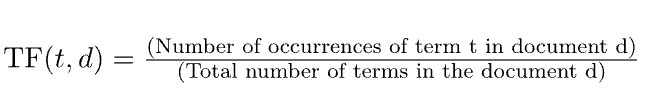

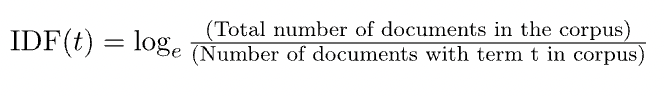

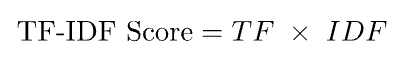

In [12]:
import nltk 
# nltk.download('punkt') # Download 'punkt' 
# from nltk if it's not downloaded 
from nltk.tokenize import sent_tokenize 
from sklearn.feature_extraction.text import TfidfVectorizer 
  
Text = """asdjfnjf sd asjdnf aksd sd fjasd fkajsd fajskdfasdjk fsa sd fd. sd. sd"""
  
# TOKENIZATION 
sentences = sent_tokenize(Text) 
sentences = [sent.lower().replace(".", "") for sent in sentences] 
print('Our Corpus:', sentences) 
  
# TF-IDF 
tfidf = TfidfVectorizer() 
tfidf_matrix = tfidf.fit_transform(sentences) 
  
# All words in the vocabulary. 
print("vocabulary", tfidf.vocabulary_) 
# IDF value for all words in the vocabulary 
print("IDF for all words in the vocabulary :\n", tfidf.idf_) 
  
# TFIDF representation for all documents in our corpus 
print('\nTFIDF representation for "{}" is \n{}'
      .format(sentences[0], tfidf_matrix[0].toarray()))
  
# TFIDF representation for a new text 
matrix = tfidf.transform(["sd fjasd fkajsd"]) 
print("\nTFIDF representation for  'sd fjasd fkajsd' is\n", 
      matrix.toarray())

Our Corpus: ['asdjfnjf sd asjdnf aksd sd fjasd fkajsd fajskdfasdjk fsa sd fd', 'sd', 'sd']
vocabulary {'asdjfnjf': 1, 'sd': 8, 'asjdnf': 2, 'aksd': 0, 'fjasd': 5, 'fkajsd': 6, 'fajskdfasdjk': 3, 'fsa': 7, 'fd': 4}
IDF for all words in the vocabulary :
 [1.69314718 1.69314718 1.69314718 1.69314718 1.69314718 1.69314718
 1.69314718 1.69314718 1.        ]

TFIDF representation for "asdjfnjf sd asjdnf aksd sd fjasd fkajsd fajskdfasdjk fsa sd fd" is 
[[0.2996182  0.2996182  0.2996182  0.2996182  0.2996182  0.2996182
  0.2996182  0.2996182  0.53087801]]

TFIDF representation for  'sd fjasd fkajsd' is
 [[0.         0.         0.         0.         0.         0.65249088
  0.65249088 0.         0.38537163]]


#### Word embedding

##### Как их можно обучать?

- Предсказывать центральное слово по контексту

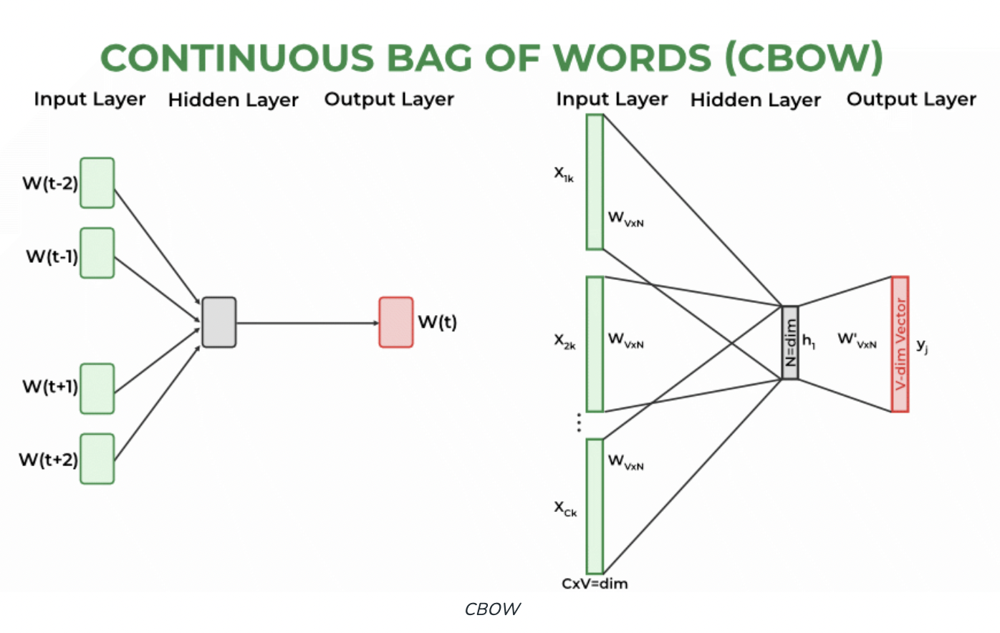

- Предсказываем контекст по центральному слову

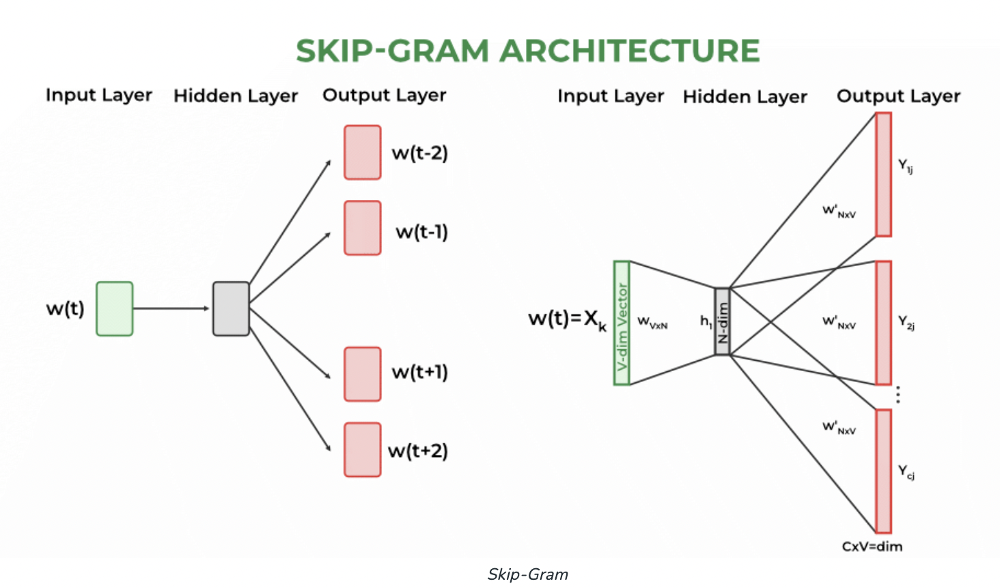

##### Но можно брать уже обученные


###### Word2Vec

In [81]:
import gensim.downloader as api 
  
# load the pre-trained Word2Vec model 
model = api.load('word2vec-google-news-300') 
  
# define word pairs to compute similarity for 
word_pairs = [('learn', 'learning'), ('india', 'indian'), ('fame', 'famous')] 

# compute similarity for each pair of words 
for pair in word_pairs: 
    similarity = model.similarity(pair[0], pair[1]) 
    print(f"Similarity between '{pair[0]}' and '{pair[1]}' using Word2Vec: {similarity:.3f}")

Similarity between 'learn' and 'learning' using Word2Vec: 0.637
Similarity between 'india' and 'indian' using Word2Vec: 0.697
Similarity between 'fame' and 'famous' using Word2Vec: 0.326


###### GloVe

In [18]:
import torch
try:
    import torchtext.vocab as vocab 
      
    # load the pre-trained GloVe model 
    glove = vocab.GloVe(name='840B', dim=300) 
      
    # define word pairs to compute similarity for 
    word_pairs = [('learn', 'learning'), ('india', 'indian'), ('fame', 'famous')] 
      
    # compute similarity for each pair of words 
    for pair in word_pairs: 
        vec1, vec2 = glove[pair[0]], glove[pair[1]] 
        similarity = torch.dot(vec1, vec2) / (torch.norm(vec1) * torch.norm(vec2)) 
        print(f"Similarity between '{pair[0]}' and '{pair[1]}' using GloVe: {similarity:.3f}")
except OSError:
    print('MacOs is shit for this')

MacOs is shit for this


###### FastText

In [16]:
import gensim.downloader as api 
  
# load the pre-trained fastText model 
fasttext_model = api.load("fasttext-wiki-news-subwords-300") 
  
# define word pairs to compute similarity for 
word_pairs = [('learn', 'learning'), ('india', 'indian'), ('fame', 'famous')] 
  
# compute similarity for each pair of words 
for pair in word_pairs:
    similarity = fasttext_model.similarity(pair[0], pair[1]) 
    print(f"Similarity between '{pair[0]}' and '{pair[1]}' using Word2Vec: {similarity:.3f}")

[==================================================] 100.0% 958.5/958.4MB downloaded
Similarity between 'learn' and 'learning' using Word2Vec: 0.642
Similarity between 'india' and 'indian' using Word2Vec: 0.708
Similarity between 'fame' and 'famous' using Word2Vec: 0.519


#### Какие модели можно использовать над полученными векторами?

- Любые из scikit-learn
- Полносвязные нейросети
- Рекуррентные нейросети

#### Рекуррентные нейросети

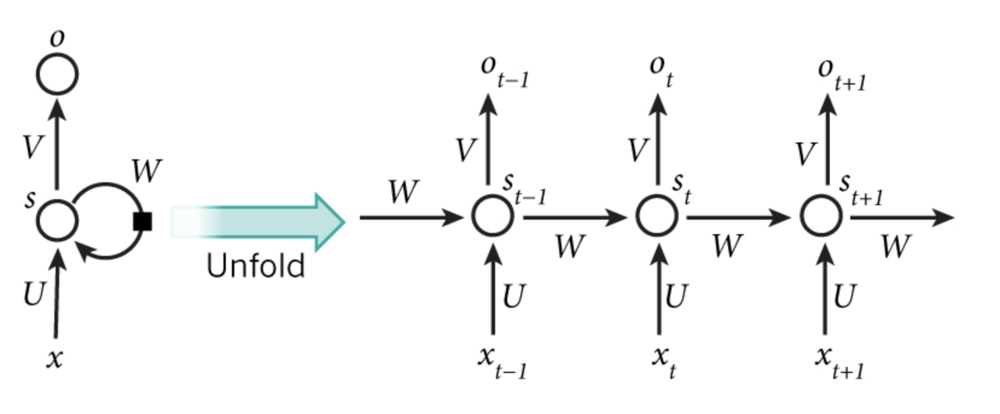

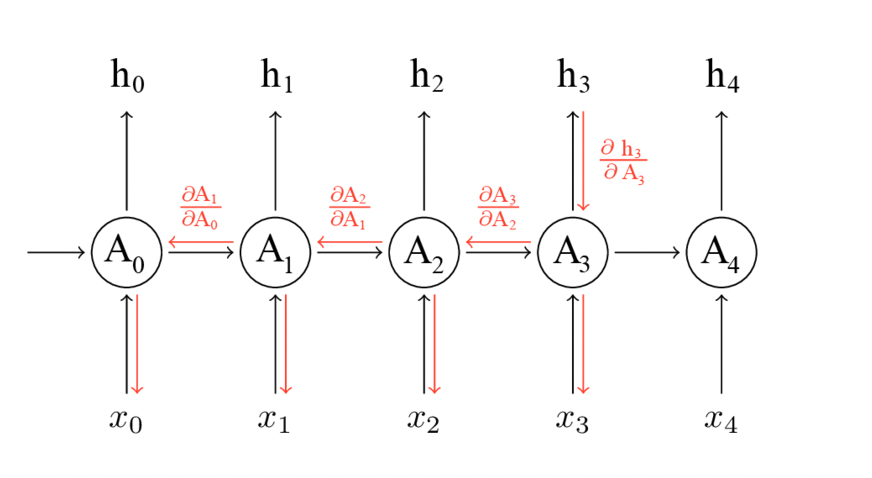

Самая популярная - LSTM

#### LSTM

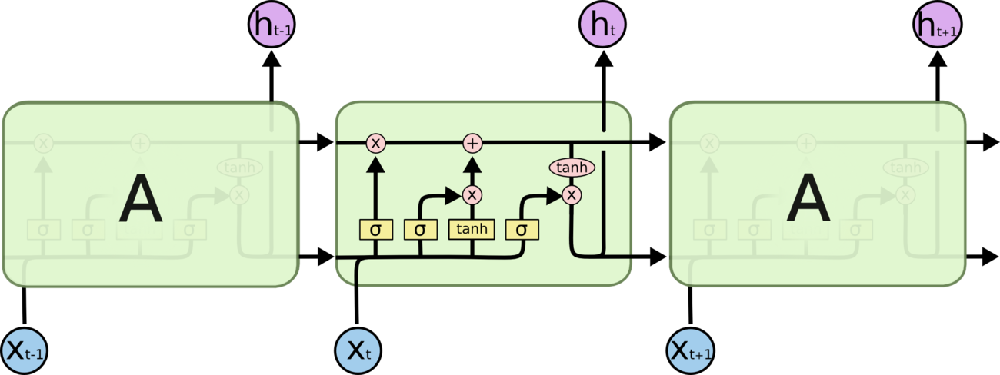

Сперва “слой фильтра забывания” (англ. forget gate layer) определяет, какую информацию можно забыть или оставить. Значения, которые ближе к 0 будут забыты, а к 1 оставлены.

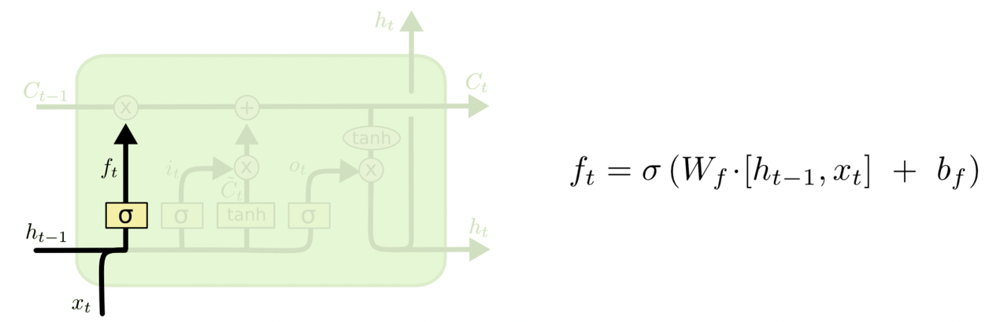

Далее решается, какая новая информация будет храниться в состоянии ячейки. Этот этап состоит из двух частей. Сначала сигмоидальный слой под названием “слой входного фильтра” (англ. input layer gate) определяет, какие значения следует обновить. Затем tanh-слой строит вектор новых значений-кандидатов C_t, которые можно добавить в состояние ячейки.

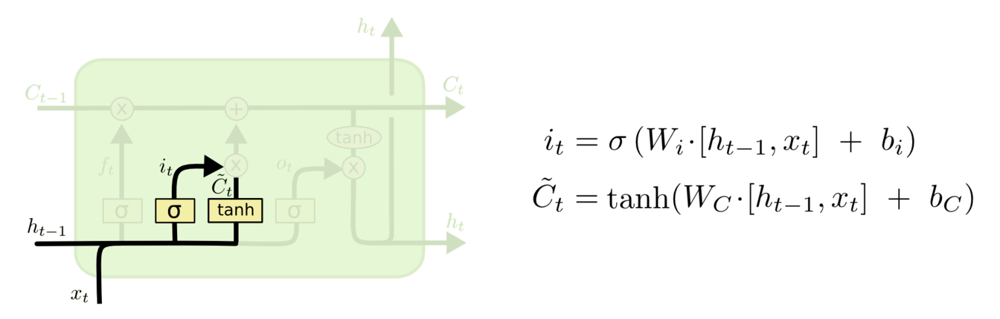

Для замены старого состояния ячейки C_t−1 на новое состояние C_t. Необходимо умножить старое состояние на f_t, забывая то, что решили забыть ранее. Затем прибавляем i_t * C_t. Это новые значения-кандидаты, умноженные на t – на сколько обновить каждое из значений состояния.

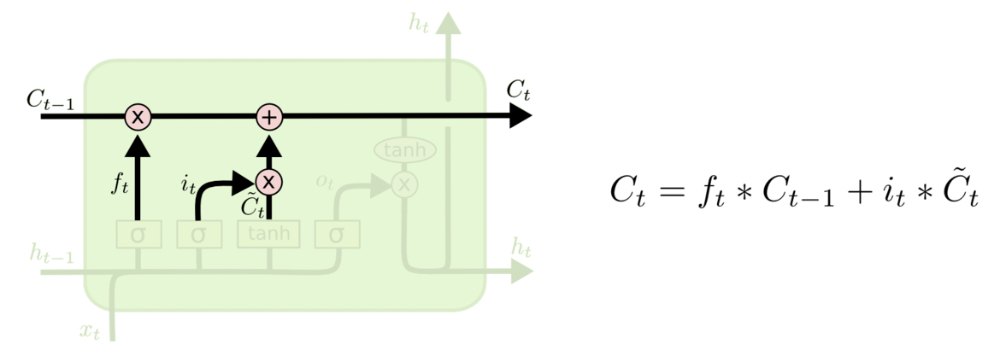

На последнем этапе определяется то, какая информация будет получена на выходе. Выходные данные будут основаны на нашем состоянии ячейки, к ним будут применены некоторые фильтры. Сначала значения предыдущего выхода h_t-1 и текущего входа x_t пропускаются через сигмоидальный слой, который решает, какая информация из состояния ячейки будет выведена. Затем значения состояния ячейки проходят через tanh-слой, чтобы получить на выходе значения из диапазона от -1 до 1, и перемножаются с выходными значениями сигмоидального слоя, что позволяет выводить только требуемую информацию.

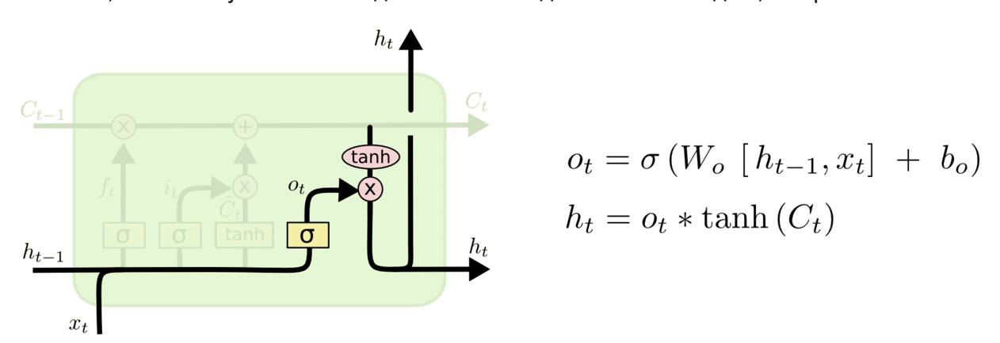

In [17]:
import torch
import torch.nn as nn
lst
rnn = nn.LSTM(10, 20, 2)
input = torch.randn(5, 3, 10)
h0 = torch.randn(2, 3, 20)
c0 = torch.randn(2, 3, 20)
output, (hn, cn) = rnn(input, (h0, c0))

#### Code time

In [22]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from nltk.corpus import stopwords 
from collections import Counter
import string
import re
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split

df = pd.read_csv('assets/IMDB Dataset.csv')
df.head(3)

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive


In [23]:
X,y = df['review'].values,df['sentiment'].values
x_train,x_test,y_train,y_test = train_test_split(X,y,stratify=y)
print(f'shape of train data is {x_train.shape}')
print(f'shape of test data is {x_test.shape}')

shape of train data is (37500,)
shape of test data is (12500,)


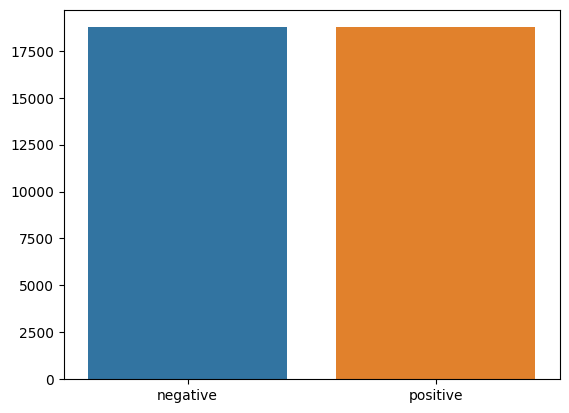

In [24]:
dd = pd.Series(y_train).value_counts()
sns.barplot(x=np.array(['negative','positive']),y=dd.values)
plt.show()

In [34]:
def preprocess_string(s):
    # Remove all non-word characters (everything except numbers and letters)
    s = re.sub(r"[^\w\s]", '', s)
    # Replace all runs of whitespaces with no space
    s = re.sub(r"\s+", '', s)
    # replace digits with no space
    s = re.sub(r"\d", '', s)

    return s

def tockenize(x_train,y_train,x_val,y_val,max_len=128):
    word_list = []

    stop_words = set(stopwords.words('english')) 
    for sent in x_train:
        for word in sent.lower().split():
            word = preprocess_string(word)
            if word not in stop_words and word != '':
                word_list.append(word)
  
    corpus = Counter(word_list)
    # sorting on the basis of most common words
    corpus_ = sorted(corpus,key=corpus.get,reverse=True)[:1000]
    # creating a dict
    onehot_dict = {w:i+1 for i,w in enumerate(corpus_)}

    
    # tockenize
    final_train_inputs = np.zeros((len(x_train), max_len), dtype=np.int32)
    final_val_inputs = np.zeros((len(x_val), max_len), dtype=np.int32)
    for idx, sent in enumerate(x_train):
            row = np.asarray([onehot_dict[preprocess_string(word)] for word in sent.lower().split() if preprocess_string(word) in onehot_dict.keys()])[:max_len]
            final_train_inputs[idx][:len(row)] = row
    for idx, sent in enumerate(x_val):
            row = np.asarray([onehot_dict[preprocess_string(word)] for word in sent.lower().split() if preprocess_string(word) in onehot_dict.keys()])[:max_len]
            final_val_inputs[idx][:len(row)] = row
            
    encoded_train = [1 if label =='positive' else 0 for label in y_train]  
    encoded_test = [1 if label =='positive' else 0 for label in y_val]
    
    return final_train_inputs, np.asarray(encoded_train),final_val_inputs, np.asarray(encoded_test),onehot_dict

In [35]:
x_train,y_train,x_test,y_test,vocab = tockenize(x_train,y_train,x_test,y_test)


In [36]:
print(f'Length of vocabulary is {len(vocab)}')

Length of vocabulary is 1000


In [64]:
# create Tensor datasets
train_data = TensorDataset(torch.from_numpy(x_train), torch.from_numpy(y_train))
valid_data = TensorDataset(torch.from_numpy(x_test), torch.from_numpy(y_test))

# dataloaders
batch_size = 32

# make sure to SHUFFLE your data
train_loader = DataLoader(train_data, shuffle=True, batch_size=batch_size, drop_last=True)
valid_loader = DataLoader(valid_data, shuffle=True, batch_size=batch_size, drop_last=True)

In [65]:
# obtain one batch of training data
sample_x, sample_y = next(iter(train_loader))

print('Sample input size: ', sample_x.size()) # batch_size, seq_length
print('Sample input: \n', sample_x)
print('Sample input: \n', sample_y)

Sample input size:  torch.Size([32, 128])
Sample input: 
 tensor([[122,   2, 521,  ...,   0,   0,   0],
        [415,   3, 484,  ...,   0,   0,   0],
        [160, 534,  43,  ...,   0,   0,   0],
        ...,
        [  6, 541, 736,  ...,   0,   0,   0],
        [ 56,   3, 201,  ..., 273,  19, 151],
        [  2,  40,   3,  ...,   0,   0,   0]], dtype=torch.int32)
Sample input: 
 tensor([1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0,
        0, 0, 1, 1, 1, 1, 0, 1])


In [66]:
class SentimentRNN(nn.Module):
    def __init__(self,no_layers,vocab_size,hidden_dim,embedding_dim,drop_prob=0.5):
        super(SentimentRNN,self).__init__()
 
        self.output_dim = output_dim
        self.hidden_dim = hidden_dim
 
        self.no_layers = no_layers
        self.vocab_size = vocab_size
    
        # embedding and LSTM layers
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        
        #lstm
        self.lstm = nn.LSTM(input_size=embedding_dim,hidden_size=self.hidden_dim,
                           num_layers=no_layers, batch_first=True)
        
        
        # dropout layer
        self.dropout = nn.Dropout(drop_prob)
    
        # linear and sigmoid layer
        self.fc = nn.Linear(self.hidden_dim, output_dim)
        self.sig = nn.Sigmoid()
        
    def forward(self,x,hidden):
        batch_size = x.size(0)
        # embeddings and lstm_out
        embeds = self.embedding(x)  # shape: B x S x Feature   since batch = True
        #print(embeds.shape)  #[50, 500, 1000]
        lstm_out, hidden = self.lstm(embeds, hidden)
        
        lstm_out = lstm_out.contiguous().view(-1, self.hidden_dim) 
        
        # dropout and fully connected layer
        out = self.dropout(lstm_out)
        out = self.fc(out)
        
        # sigmoid function
        sig_out = self.sig(out)
        
        # reshape to be batch_size first
        sig_out = sig_out.view(batch_size, -1)

        sig_out = sig_out[:, -1] # get last batch of labels
        
        # return last sigmoid output and hidden state
        return sig_out, hidden
        
        
        
    def init_hidden(self, batch_size):
        ''' Initializes hidden state '''
        # Create two new tensors with sizes n_layers x batch_size x hidden_dim,
        # initialized to zero, for hidden state and cell state of LSTM
        h0 = torch.zeros((self.no_layers,batch_size,self.hidden_dim))
        c0 = torch.zeros((self.no_layers,batch_size,self.hidden_dim))
        hidden = (h0,c0)
        return hidden

              

In [77]:
no_layers = 2
vocab_size = len(vocab) + 1 #extra 1 for padding
embedding_dim = 64
output_dim = 1
hidden_dim = 256


model = SentimentRNN(no_layers,vocab_size,hidden_dim,embedding_dim,drop_prob=0.5)
model

SentimentRNN(
  (embedding): Embedding(1001, 64)
  (lstm): LSTM(64, 256, num_layers=2, batch_first=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=256, out_features=1, bias=True)
  (sig): Sigmoid()
)

In [78]:
model = SentimentRNN(no_layers,vocab_size,hidden_dim,embedding_dim,drop_prob=0.5)

criterion = nn.BCELoss()

optimizer = torch.optim.Adam(params=model.parameters(), lr=0.01)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer=optimizer, step_size=10, gamma=0.1)

num_epochs = 1

for epoch in range(num_epochs):
    print('=========== TRAIN ===========')
    model.train()
    lr_scheduler.step()
    sum_loss_value = 0.0
    h = model.init_hidden(batch_size)
    for idx, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data, targets = batch

        h = tuple([each.data for each in h])
        
        output, h = model(data, h)
        
        loss = criterion(output.squeeze(), targets.float())
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 0.5)
        optimizer.step()
        
        sum_loss_value += loss.item()

        if idx % 50 == 1:
            print(f'loss [{idx / len(train_loader) * 100} %]: {sum_loss_value / idx}')
        
    print(f'loss: {sum_loss_value / len(train_loader)}')
        
    print('=========== VAL ===========')
    model.eval()
    metric_value, n = 0.0, 0
    val_h = model.init_hidden(batch_size)
    for batch in valid_loader:
        data, targets = batch
        with torch.no_grad():
            output, val_h = model(data, val_h)
            metric_value += (torch.round(output) == targets).sum()
            n += len(data)
    print(f'ACCURACY: {metric_value / n}')


=========== TRAIN ===========


/opt/homebrew/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:139: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "will result in PyTorch skipping the first value of the learning rate schedule. "


loss [0.08539709649871904 %]: 3.1540948152542114
loss [4.355251921434671 %]: 0.7722518572620317
loss [8.625106746370625 %]: 0.7409486174583435
loss [12.894961571306576 %]: 0.7311275814542707
loss [17.16481639624253 %]: 0.7278189407059209
loss [21.43467122117848 %]: 0.7223447499522175
loss [25.704526046114434 %]: 0.7206767829153625
loss [29.974380871050382 %]: 0.7187811397758984
loss [34.24423569598633 %]: 0.7181670881268984
loss [38.51409052092229 %]: 0.7160826152285557
loss [42.78394534585824 %]: 0.7161579568704921
loss [47.05380017079419 %]: 0.7158022162702252
loss [51.32365499573015 %]: 0.7148871422805723
loss [55.5935098206661 %]: 0.7140431211840722
loss [59.86336464560205 %]: 0.7136558114887134
loss [64.13321947053801 %]: 0.7136824985794952
loss [68.40307429547396 %]: 0.7129886420478535
loss [72.6729291204099 %]: 0.7129254196141217
loss [76.94278394534587 %]: 0.7121081706157139
loss [81.21263877028181 %]: 0.7120083314136502
loss [85.48249359521776 %]: 0.71213866256691
loss [89.752

#### BERT

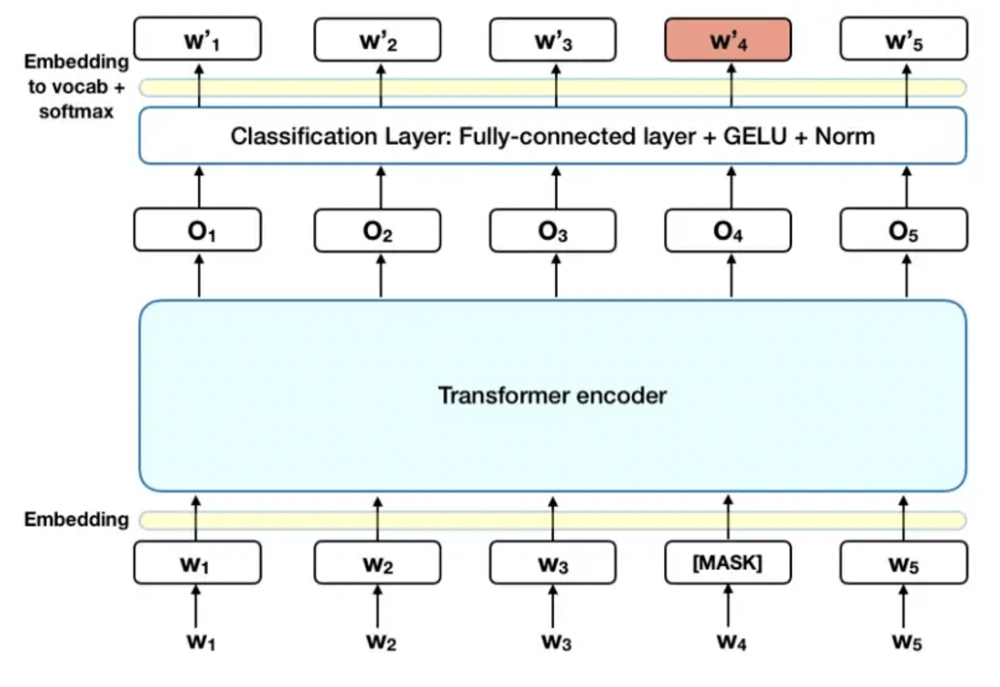

In [93]:
# 'asdf sfsd fsdasdfasdf as asd fasd f asdf' -> 'asdf sfsd [MASK] as asd [MASK] [MASK] asdf' -> BERT -> 'asdf sfsd fsdasdfasdf as asd fasd f asdf'

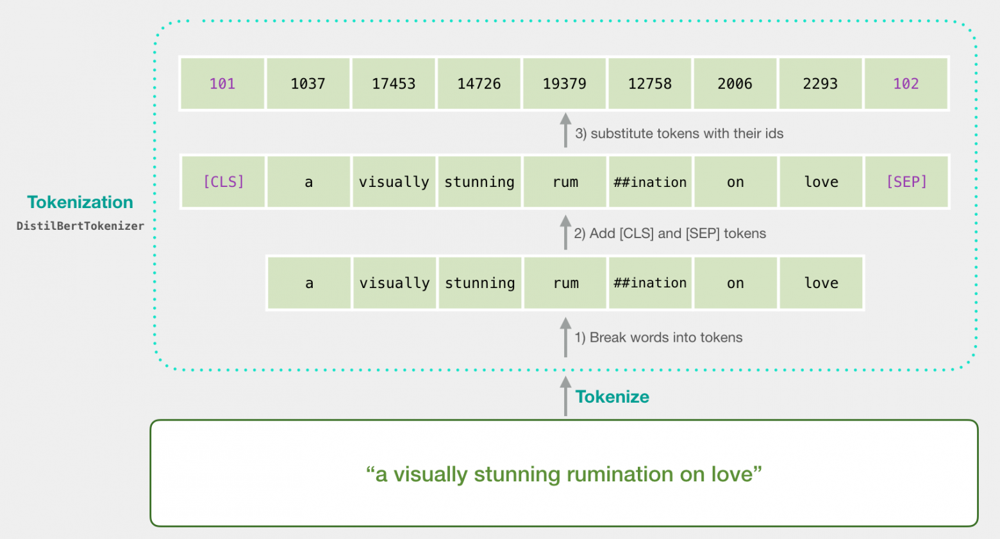

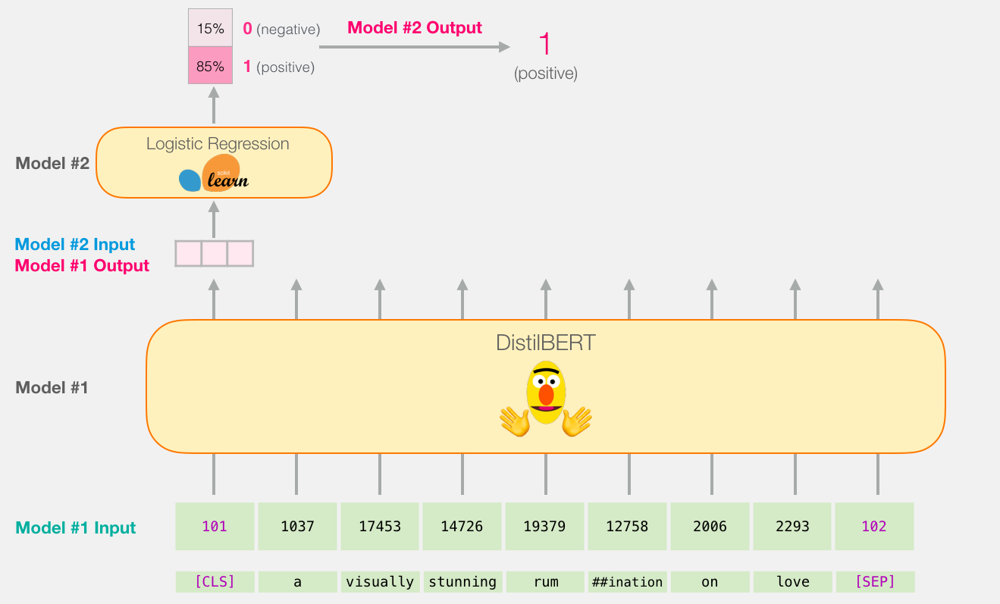

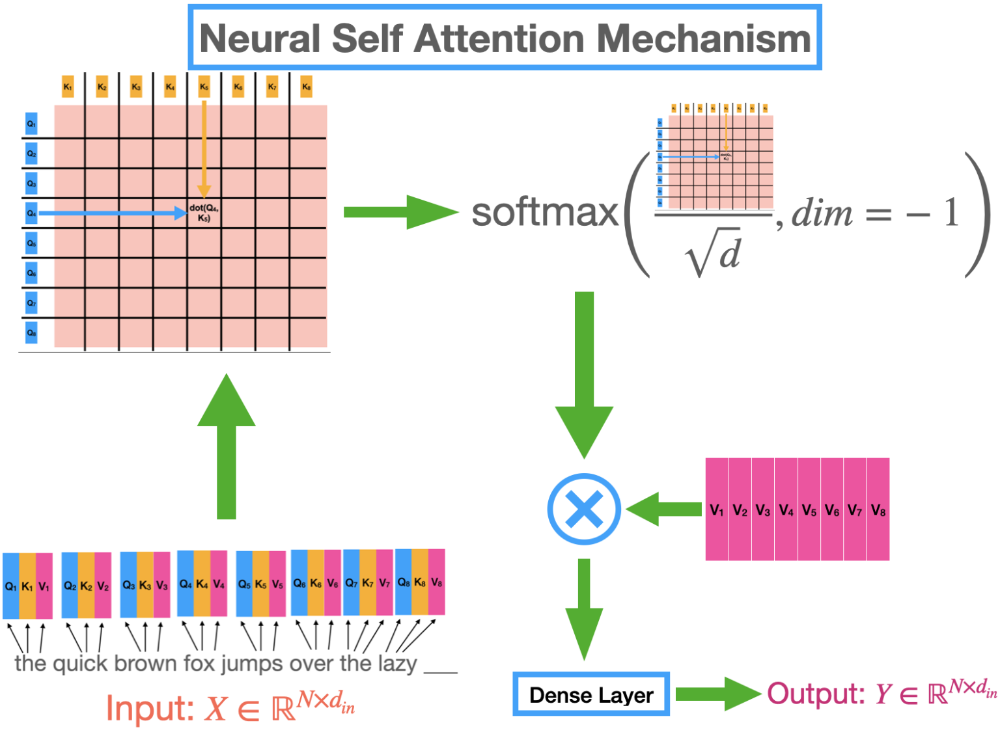

## Немного о Speech recogntion

Начнём с того, что наша речь — это последовательность звуков. Звук в свою очередь — это суперпозиция (наложение) звуковых колебаний (волн) различных частот. Волна же, как нам известно из физики, характеризуются двумя атрибутами — амплитудой и частотой.

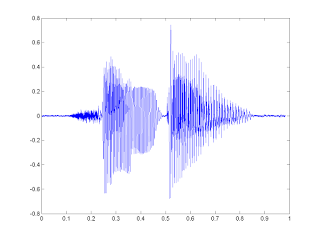

Для того, что бы сохранить звуковой сигнал на цифровом носителе, его необходимо разбить на множество промежутков и взять некоторое «усредненное» значение на каждом из них.

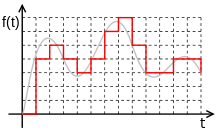

Первым делом разобьём наши данные по небольшим временным промежуткам — фреймам. Причём фреймы должны идти не строго друг за другом, а “внахлёст”. Т.е. конец одного фрейма должен пересекаться с началом другого.

Опытным путём установлено, что оптимальная длина фрейма должна соответствовать промежутку в 10мс, «нахлёст» — 50%. С учётом того, что средняя длина слова (по крайней мере в моих экспериментах) составляет 500мс — такой шаг даст нам примерно 500 / (10 * 0.5) = 100 фреймов на слово.

Первой задачей, которую приходится решать при распознавании речи, является разбиение этой самой речи на отдельные слова. Для простоты предположим, что в нашем случае речь содержит в себе некоторые паузы (промежутки тишины), которые можно считать “разделителями” слов.

В таком случае нам нужно найти некоторое значение, порог — значения выше которого являются словом, ниже — тишиной. Вариантов тут может быть несколько:
задать константой (сработает, если исходный сигнал всегда генерируется при одних и тех же условиях, одним и тем же способом);
кластеризовать значения сигнала, явно выделив множество значений соответствующих тишине (сработает только если тишина занимает значительную часть исходного сигнала);
проанализировать энтропию

Для того, что бы подсчитать энтропию конкретного фрейма выполним следующие действия:

- предположим, что наш сигнал пронормирован и все его значения лежат в диапазоне [-1;1];
- построим гистограмму (плотность распределения) значений сигнала фрейма:

рассчитаем энтропию, как

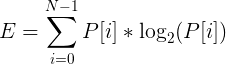

Как еще можно?

Представим наш фрейм в виде вектора 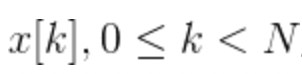, где N — размер фрейма.

1. Первым делом рассчитываем спектр сигнала с помощью дискретного преобразования Фурье (желательно его “быстрой” FFT реализацией).

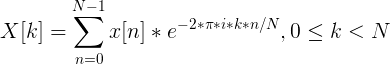

2. Так же к полученным значениям рекомендуется применить оконную функцию Хэмминга, что бы “сгладить” значения на границах фреймов.





Важно понимать, что после этого преобразования по оси Х мы имеем частоту (hz) сигнала, а по оси Y — магнитуду (как способ уйти от комплексных значений):

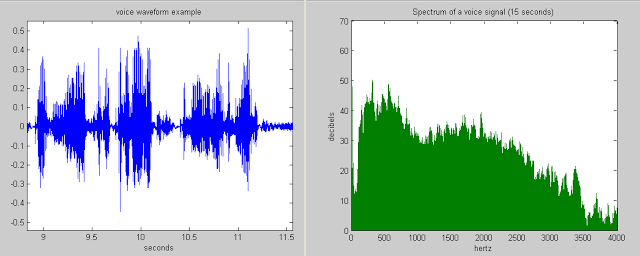

Начнём с того, что такое mel. Опять же согласно Википедии, mel — это “психофизическая единица высоты звука”, основанная на субъективном восприятии среднестатистическими людьми. Зависит в первую очередь от частоты звука (а так же от громкости и тембра). Другими словами, эта величина, показывающая, на сколько звук определённой частоты “значим” для нас.

3. Преобразовать частоту в мел можно по следующей формуле (запомним её как «формула-1»):



График зависимости mel / частота:

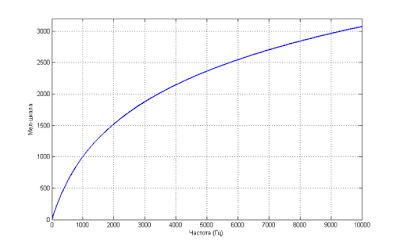

#### Спектрограмма
Спектрограмма - это визуальный способ представления уровня или “громкости” сигнала во времени на различных частотах, присутствующих в форме волны. Обычно изображается в виде тепловой карты.

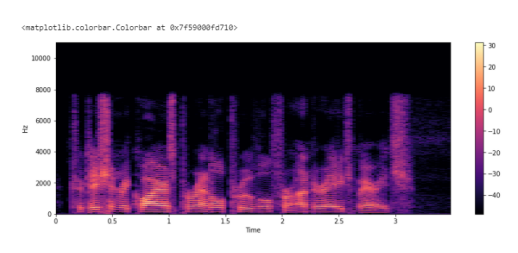

Ну а далее к этим данным применяют нейронки

## Временные ряды

**Стационарность** - это свойство временного ряда, которое означает, что его средние и стандартные отклонения не меняются со временем. Если временной ряд является стационарным, то его можно легко анализировать и прогнозировать. Нестационарный временной ряд может иметь тренд (постоянный рост или падение), цикличность (повторение циклов) или сезонность (повторение определенных событий в разное время года).

**Автокорреляция** - это мера корреляции между значениями ряда с разницей во времени. Если временной ряд имеет высокую автокорреляцию, это означает, что значения ряда в разные периоды времени имеют сильную связь между собой. Автокорреляцию можно вычислить с помощью функции корреляции Пирсона, которая вычисляет корреляцию между двумя переменными. Для временных рядов это означает вычисление корреляции между значениями ряда в разные периоды времени. Если автокорреляция является значимой, то это может означать наличие тренда, цикличности или сезонности в ряде.

Авторегрессионные модели (AR-модели) используют прошлые значения ряда для прогнозирования его будущих значений. Эта модель предполагает, что текущее значение ряда зависит от его предыдущих значений. Наиболее популярной AR-моделью является модель первого порядка (AR(1)), которая предполагает, что текущее значение ряда зависит только от его предыдущего значения.

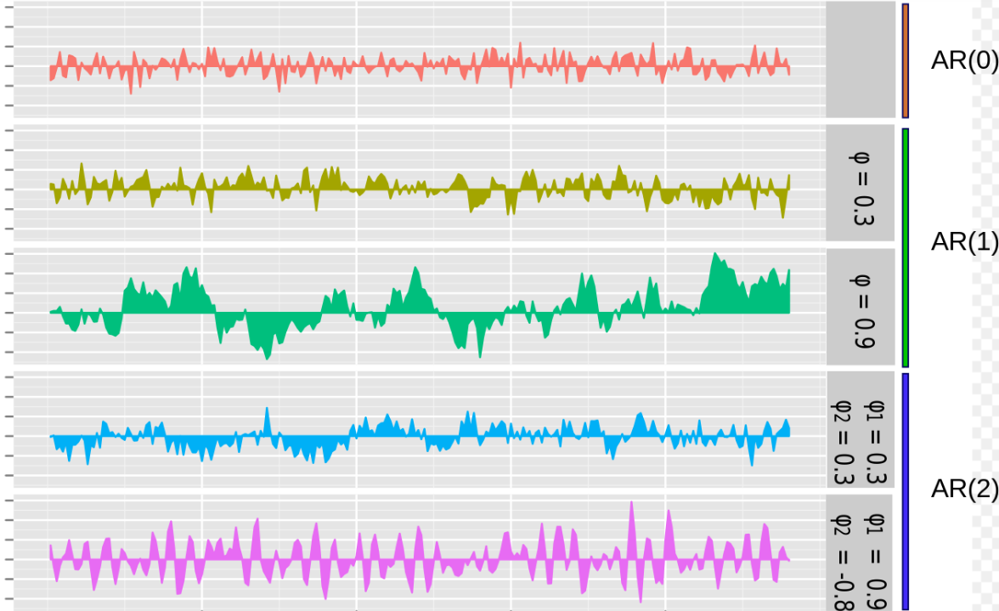

По факту это линейная модель, в которой прогнозированная величина является суммой прошлых значений, умноженных на числовой множитель.

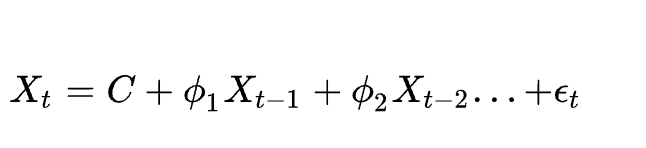

Следующий метод моделирования временных рядов - скользящее среднее (MA-модели). Эта модель использует прошлые значения ошибок - разницу между фактическими значениями ряда и его прогнозируемыми значениями, для прогнозирования будущих значений. Наиболее популярной MA-моделью является модель первого порядка (MA(1)), которая предполагает, что текущая ошибка зависит только от ее предыдущего значения.

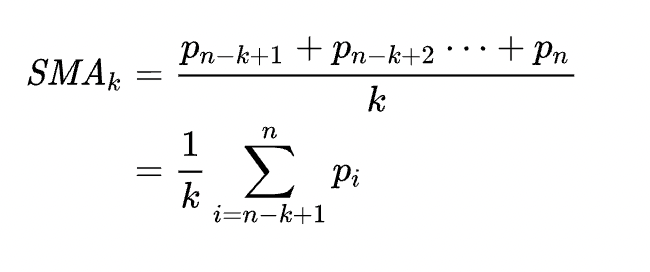

**ARIMA** - это модель, комбинирующая авторегрессионные и скользящие средние модели. ARIMA позволяет моделировать данные, не являющиеся стационарными, как это не требуется для AR- и MA-моделей. ARIMA включает три параметра: параметр авторегрессии (р), параметр скользящего среднего (q) и параметр интегрирования (d). 

**SARIMA** - это модель, комбинирующая ARIMA с сезонностью. SARIMA используется для моделирования сезонного поведения временных рядов. SARIMA - это расширение ARIMA с тремя дополнительными параметрами, определяющими сезонность: период сезонности (P), параметр авторегрессии со сезонностью (S) и параметр скользящего среднего со сезонностью (Q).

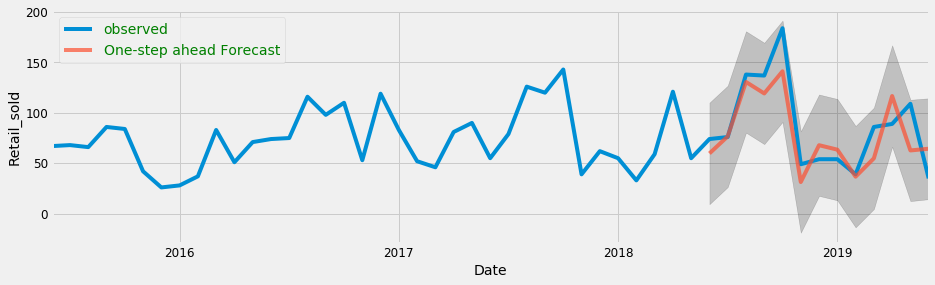

Для анализа временных рядов полезно разложить ряд на состовляющие:

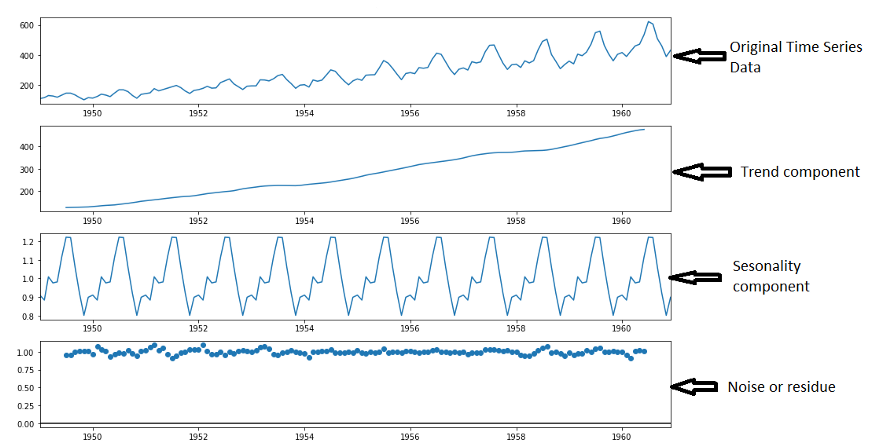

Но лучше нейросети

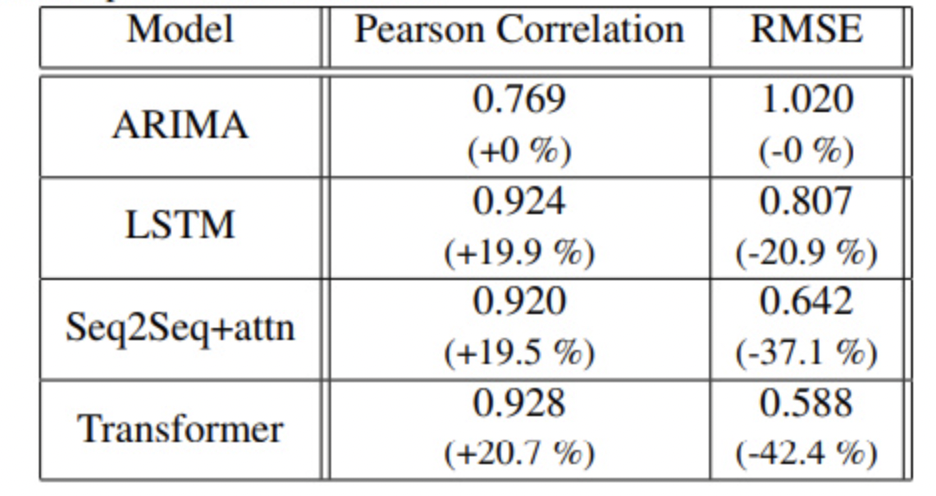

### Code time

In [135]:
dt = pd.read_csv('assets/IMDB Dataset.csv').sample(frac=1)

dt.head(3)

,review,sentiment
150,A young girl becomes a war-time marine's pen-p...,positive
42926,"Even 20+ years later, Ninja Mission stands out...",negative
16598,"According to IMDb, as well as to every other w...",negative


In [136]:
dt['review'].apply(len).describe()

count    50000.000000
mean      1309.431020
std        989.728014
min         32.000000
25%        699.000000
50%        970.000000
75%       1590.250000
max      13704.000000
Name: review, dtype: float64

In [137]:
dt['review'] = dt['review'].apply(
    lambda x: x.replace('<br />', '')
)

dt.head(3)

,review,sentiment
150,A young girl becomes a war-time marine's pen-p...,positive
42926,"Even 20+ years later, Ninja Mission stands out...",negative
16598,"According to IMDb, as well as to every other w...",negative


In [138]:
dt['review'] = dt['review'].apply(
    lambda x: x.translate(str.maketrans('', '', string.punctuation))
)

dt.head(3)

,review,sentiment
150,A young girl becomes a wartime marines penpal ...,positive
42926,Even 20 years later Ninja Mission stands out a...,negative
16598,According to IMDb as well as to every other we...,negative


In [139]:
dt['review'] = dt['review'].apply(
    lambda x: x.lower()
)

dt.head(3)

,review,sentiment
150,a young girl becomes a wartime marines penpal ...,positive
42926,even 20 years later ninja mission stands out a...,negative
16598,according to imdb as well as to every other we...,negative


In [140]:
stop_words = set(stopwords.words('english')) 

dt['review'] = dt['review'].apply(
    lambda x: ' '.join([
        word for word in x.split() if word not in stop_words
    ])
)

dt.head(3)

,review,sentiment
150,young girl becomes wartime marines penpal visi...,positive
42926,even 20 years later ninja mission stands worst...,negative
16598,according imdb well every website holds review...,negative


In [141]:
dt['review'] = dt['review'].apply(
    lambda x: re.sub("^\d+\s|\s\d+\s|\s\d+$", " ", x)
)

dt.head(3)

,review,sentiment
150,young girl becomes wartime marines penpal visi...,positive
42926,even years later ninja mission stands worst mo...,negative
16598,according imdb well every website holds review...,negative


In [142]:
dt['review'].apply(
    lambda x: len(x.split())
).describe()

count    50000.000000
mean       118.918300
std         89.518672
min          3.000000
25%         64.000000
50%         88.000000
75%        145.000000
max       1420.000000
Name: review, dtype: float64

In [143]:
dt['sentiment'] = dt['sentiment'].apply(lambda x: int(x == 'positive'))
dt.head(3)

,review,sentiment
150,young girl becomes wartime marines penpal visi...,1
42926,even years later ninja mission stands worst mo...,0
16598,according imdb well every website holds review...,0


In [152]:
vectorizer = CountVectorizer(max_features=2048) 

vectorizer.fit(dt['review'].values)

CountVectorizer(max_features=2048)

In [153]:
X = vectorizer.transform(dt['review'].values).todense()
X

matrix([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]])

In [154]:
x_train, x_val, y_train, y_val = X[:40000], X[40000:], dt['sentiment'].values[:40000], dt['sentiment'].values[40000:]

In [155]:
from catboost import CatBoostClassifier

model = CatBoostClassifier()

model.fit(x_train.astype(np.float32), y_train)

Learning rate set to 0.049775
0:	learn: 0.6778229	total: 88.5ms	remaining: 1m 28s
1:	learn: 0.6646206	total: 162ms	remaining: 1m 20s
2:	learn: 0.6528019	total: 232ms	remaining: 1m 17s
3:	learn: 0.6427121	total: 282ms	remaining: 1m 10s
4:	learn: 0.6339773	total: 341ms	remaining: 1m 7s
5:	learn: 0.6259926	total: 397ms	remaining: 1m 5s
6:	learn: 0.6185940	total: 469ms	remaining: 1m 6s
7:	learn: 0.6125821	total: 530ms	remaining: 1m 5s
8:	learn: 0.6062840	total: 576ms	remaining: 1m 3s
9:	learn: 0.6006067	total: 647ms	remaining: 1m 4s
10:	learn: 0.5954692	total: 712ms	remaining: 1m 4s
11:	learn: 0.5905537	total: 779ms	remaining: 1m 4s
12:	learn: 0.5860348	total: 836ms	remaining: 1m 3s
13:	learn: 0.5818423	total: 912ms	remaining: 1m 4s
14:	learn: 0.5780642	total: 970ms	remaining: 1m 3s
15:	learn: 0.5741886	total: 1.03s	remaining: 1m 3s
16:	learn: 0.5704785	total: 1.08s	remaining: 1m 2s
17:	learn: 0.5669118	total: 1.13s	remaining: 1m 1s
18:	learn: 0.5638486	total: 1.2s	remaining: 1m 2s
19:	lea

In [156]:
from sklearn.metrics import accuracy_score

predictions = model.predict(x_val.astype(np.float32))

accuracy_score(predictions, y_val)

0.8624

In [157]:
vectorizer = TfidfVectorizer(max_features=1024)

vectorizer.fit(dt['review'].values)

TfidfVectorizer(max_features=1024)

In [158]:
X = vectorizer.transform(dt['review'].values).todense()
X

matrix([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.29363629, 0.        , ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        , 0.15331077,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ]])

In [159]:
x_train, x_val, y_train, y_val = X[:40000], X[40000:], dt['sentiment'].values[:40000], dt['sentiment'].values[40000:]

In [160]:
model = CatBoostClassifier()

model.fit(x_train.astype(np.float32), y_train)

Learning rate set to 0.049775
0:	learn: 0.6781532	total: 135ms	remaining: 2m 14s
1:	learn: 0.6651038	total: 211ms	remaining: 1m 45s
2:	learn: 0.6545018	total: 298ms	remaining: 1m 38s
3:	learn: 0.6435677	total: 378ms	remaining: 1m 34s
4:	learn: 0.6342977	total: 459ms	remaining: 1m 31s
5:	learn: 0.6256218	total: 542ms	remaining: 1m 29s
6:	learn: 0.6186358	total: 608ms	remaining: 1m 26s
7:	learn: 0.6120079	total: 690ms	remaining: 1m 25s
8:	learn: 0.6066968	total: 823ms	remaining: 1m 30s
9:	learn: 0.6014969	total: 902ms	remaining: 1m 29s
10:	learn: 0.5958375	total: 960ms	remaining: 1m 26s
11:	learn: 0.5907013	total: 1.04s	remaining: 1m 25s
12:	learn: 0.5863182	total: 1.12s	remaining: 1m 24s
13:	learn: 0.5822726	total: 1.19s	remaining: 1m 23s
14:	learn: 0.5778703	total: 1.25s	remaining: 1m 22s
15:	learn: 0.5737918	total: 1.31s	remaining: 1m 20s
16:	learn: 0.5704423	total: 1.36s	remaining: 1m 18s
17:	learn: 0.5670865	total: 1.43s	remaining: 1m 17s
18:	learn: 0.5639515	total: 1.49s	remaining:

In [161]:
predictions = model.predict(x_val.astype(np.float32))

accuracy_score(predictions, y_val)

0.853

In [162]:
vectorizer = api.load('word2vec-google-news-300')

In [180]:
vectors = [
    [
        vectorizer.word_vec(word) for word in sent.split() if word in vectorizer.key_to_index
    ]
    for sent in dt['review'].values
]

/var/folders/7n/x91z7cyn15z28lc2w67s1g34yqn47w/T/ipykernel_85777/2005457161.py:3: DeprecationWarning: Call to deprecated `word_vec` (Use get_vector instead).
  vectorizer.word_vec(word) for word in sent.split() if word in vectorizer.key_to_index


In [181]:
X = [np.mean(sent, axis=0) for sent in vectors]

In [182]:
x_train, x_val, y_train, y_val = X[:40000], X[40000:], dt['sentiment'].values[:40000], dt['sentiment'].values[40000:]

In [184]:
model = CatBoostClassifier()

model.fit(x_train, y_train)

Learning rate set to 0.049775
0:	learn: 0.6775545	total: 28.3ms	remaining: 28.2s
1:	learn: 0.6639189	total: 54.5ms	remaining: 27.2s
2:	learn: 0.6514596	total: 70.7ms	remaining: 23.5s
3:	learn: 0.6406945	total: 103ms	remaining: 25.6s
4:	learn: 0.6306238	total: 137ms	remaining: 27.3s
5:	learn: 0.6207012	total: 159ms	remaining: 26.4s
6:	learn: 0.6116840	total: 179ms	remaining: 25.4s
7:	learn: 0.6034484	total: 206ms	remaining: 25.6s
8:	learn: 0.5957903	total: 228ms	remaining: 25.1s
9:	learn: 0.5887493	total: 247ms	remaining: 24.4s
10:	learn: 0.5819951	total: 268ms	remaining: 24.1s
11:	learn: 0.5755735	total: 285ms	remaining: 23.4s
12:	learn: 0.5690273	total: 312ms	remaining: 23.7s
13:	learn: 0.5630489	total: 333ms	remaining: 23.5s
14:	learn: 0.5577299	total: 349ms	remaining: 22.9s
15:	learn: 0.5530968	total: 379ms	remaining: 23.3s
16:	learn: 0.5478006	total: 402ms	remaining: 23.2s
17:	learn: 0.5430415	total: 431ms	remaining: 23.5s
18:	learn: 0.5386175	total: 448ms	remaining: 23.1s
19:	lear

In [185]:
predictions = model.predict(x_val)

accuracy_score(predictions, y_val)

0.8534

In [186]:
vectorizer = api.load("fasttext-wiki-news-subwords-300") 


In [187]:
vectors = [
    [
        vectorizer.word_vec(word) for word in sent.split() if word in vectorizer.key_to_index
    ]
    for sent in dt['review'].values
]

/var/folders/7n/x91z7cyn15z28lc2w67s1g34yqn47w/T/ipykernel_85777/2005457161.py:3: DeprecationWarning: Call to deprecated `word_vec` (Use get_vector instead).
  vectorizer.word_vec(word) for word in sent.split() if word in vectorizer.key_to_index


In [188]:
X = [np.mean(sent, axis=0) for sent in vectors]

In [189]:
x_train, x_val, y_train, y_val = X[:40000], X[40000:], dt['sentiment'].values[:40000], dt['sentiment'].values[40000:]

In [190]:
model = CatBoostClassifier()

model.fit(x_train, y_train)

Learning rate set to 0.049775
0:	learn: 0.6792372	total: 33.9ms	remaining: 33.8s
1:	learn: 0.6666082	total: 58.1ms	remaining: 29s
2:	learn: 0.6558205	total: 78.9ms	remaining: 26.2s
3:	learn: 0.6457815	total: 112ms	remaining: 27.9s
4:	learn: 0.6369764	total: 142ms	remaining: 28.3s
5:	learn: 0.6279760	total: 167ms	remaining: 27.7s
6:	learn: 0.6198511	total: 185ms	remaining: 26.3s
7:	learn: 0.6121709	total: 211ms	remaining: 26.2s
8:	learn: 0.6053614	total: 233ms	remaining: 25.7s
9:	learn: 0.5986206	total: 261ms	remaining: 25.8s
10:	learn: 0.5920671	total: 291ms	remaining: 26.2s
11:	learn: 0.5865617	total: 308ms	remaining: 25.4s
12:	learn: 0.5807429	total: 324ms	remaining: 24.6s
13:	learn: 0.5754196	total: 353ms	remaining: 24.9s
14:	learn: 0.5703066	total: 378ms	remaining: 24.8s
15:	learn: 0.5656911	total: 396ms	remaining: 24.4s
16:	learn: 0.5611999	total: 424ms	remaining: 24.5s
17:	learn: 0.5564210	total: 450ms	remaining: 24.5s
18:	learn: 0.5520582	total: 468ms	remaining: 24.1s
19:	learn:

In [191]:
predictions = model.predict(x_val)

accuracy_score(predictions, y_val)

0.8474

In [193]:
vectorizer = api.load('word2vec-google-news-300')

In [194]:
words = [
    [
        word for word in sent.split() if word in vectorizer.key_to_index
    ]
    for sent in dt['review'].values
]

In [196]:
tfidf_vectorizer = TfidfVectorizer()

tfidf_vectorizer.fit([' '.join(sent) for sent in words])

TfidfVectorizer()

In [202]:
words_vectors = [
    [
        vectorizer.word_vec(word) for word in sent
    ]
    for sent in words
]

/var/folders/7n/x91z7cyn15z28lc2w67s1g34yqn47w/T/ipykernel_85777/1723434689.py:3: DeprecationWarning: Call to deprecated `word_vec` (Use get_vector instead).
  vectorizer.word_vec(word) for word in sent


In [203]:
tfidf_vectors = tfidf_vectorizer.transform([' '.join(sent) for sent in words])


In [205]:
words_vectors[0]

[array([ 0.09472656,  0.328125  , -0.04858398, -0.00665283, -0.03295898,
        -0.05053711, -0.06176758, -0.06030273, -0.12353516,  0.06738281,
         0.10742188,  0.0177002 , -0.02807617, -0.04980469, -0.13769531,
        -0.140625  , -0.10058594,  0.28710938, -0.10791016,  0.07373047,
         0.07714844,  0.0703125 , -0.02758789,  0.03149414, -0.0168457 ,
        -0.21386719, -0.03955078,  0.22460938,  0.08154297,  0.01275635,
         0.02490234,  0.04467773,  0.00588989,  0.03857422,  0.1171875 ,
        -0.05444336, -0.01599121, -0.07666016, -0.03063965,  0.19726562,
        -0.01550293,  0.04150391, -0.00274658, -0.08349609,  0.16210938,
         0.01104736, -0.08691406, -0.02050781, -0.03393555, -0.06982422,
         0.05126953,  0.07275391, -0.08447266, -0.03686523,  0.07763672,
        -0.12451172,  0.10986328, -0.0456543 , -0.33984375,  0.05957031,
         0.078125  ,  0.07373047, -0.04370117, -0.0324707 ,  0.04882812,
        -0.00285339,  0.04394531,  0.02868652,  0.1

In [222]:
X = []

for sent_idx in range(len(words)):
    word_sum = np.zeros((300, ))
    for word_idx, word in enumerate(words[sent_idx]):
        word_vector = words_vectors[sent_idx][word_idx]

        if word in tfidf_vectorizer.vocabulary_:
            tfidf_coef = tfidf_vectors[sent_idx, tfidf_vectorizer.vocabulary_[word]]
        else:
            tfidf_coef = 0.0

        word_sum += tfidf_coef * word_vector
    word_sum /= len(words[sent_idx]) + 1e-9

    X.append(word_sum)

In [225]:
x_train, x_val, y_train, y_val = X[:40000], X[40000:], dt['sentiment'].values[:40000], dt['sentiment'].values[40000:]

In [226]:
model = CatBoostClassifier()

model.fit(x_train, y_train)

Learning rate set to 0.049775
0:	learn: 0.6840753	total: 22.5ms	remaining: 22.5s
1:	learn: 0.6760045	total: 39.8ms	remaining: 19.9s
2:	learn: 0.6681995	total: 56.1ms	remaining: 18.6s
3:	learn: 0.6610294	total: 75.3ms	remaining: 18.7s
4:	learn: 0.6544369	total: 92.6ms	remaining: 18.4s
5:	learn: 0.6482434	total: 114ms	remaining: 18.9s
6:	learn: 0.6425367	total: 131ms	remaining: 18.6s
7:	learn: 0.6370544	total: 147ms	remaining: 18.2s
8:	learn: 0.6318682	total: 164ms	remaining: 18.1s
9:	learn: 0.6269065	total: 183ms	remaining: 18.1s
10:	learn: 0.6225337	total: 204ms	remaining: 18.3s
11:	learn: 0.6176930	total: 225ms	remaining: 18.5s
12:	learn: 0.6135146	total: 243ms	remaining: 18.4s
13:	learn: 0.6094845	total: 260ms	remaining: 18.3s
14:	learn: 0.6057225	total: 278ms	remaining: 18.2s
15:	learn: 0.6021908	total: 295ms	remaining: 18.1s
16:	learn: 0.5983583	total: 312ms	remaining: 18.1s
17:	learn: 0.5949905	total: 330ms	remaining: 18s
18:	learn: 0.5916672	total: 347ms	remaining: 17.9s
19:	lear

In [227]:
predictions = model.predict(x_val)

accuracy_score(predictions, y_val)

0.8133